<div style="background: linear-gradient(90deg, #6a040f, #d00000); padding: 30px;  border-radius:15px; text-align: center;">
  <h1 style="color: white; font-size: 48px; font-weight: bold; margin: 0; font-family: Arial, sans-serif;">
    Rainfall Prediction Project
  </h1>

</div>

<a id='target'></a>
## <div style="text-align:center; border-radius:15px 50px; padding:7px; color:white; margin:0; font-size:100%; font-family:Pacifico; background-color:#d00000; overflow:hidden"><b> 1. Introduction  </b></div>

## About Dataset
This data is from a Kaggle competition and includes three files: `train`, `test`, and `sub`. The model is trained using the `train` dataset, then applied to the `test` dataset to make predictions. These predictions are then formatted according to the `sub` (submission) file and submitted for evaluation. [Dataset Link](http://https://www.kaggle.com/competitions/playground-series-s5e3)


## Business Problem

Accurate rainfall prediction is a critical challenge for businesses. Unpredictable weather leads to financial losses, and causes problems in the logistics and agriculture sectors. However, this also creates a new business opportunity to provide real-time weather-related solutions that address these challenges.

1) Supply Chain & Risk Management
2) Disaster Preparedness & Response
3) Agricultural Planning
4) Water Resource Management


## Analytical Approach

Our analytic approach focuses on developing a predictive model to predict rainfall is going to occur or not. We will analyze historical weather data, perform data preprocessing, feature engineering, and test various machine learning algorithms. We also used Artificial Neural Network(ANN) to increase overall accuracy.

<a id='target'></a>
## <div style="text-align:center; border-radius:15px 50px; padding:7px; color:white; margin:0; font-size:100%; font-family:Pacifico; background-color:#d00000; overflow:hidden"><b> 2. Importing Required Libraries   </b></div>

In [39]:
# 📦 Basic Libraries
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ⚠️ Warnings Control
import warnings
warnings.filterwarnings('ignore')

# 🧪 Model Selection
from sklearn.model_selection import train_test_split,RandomizedSearchCV

# ⚙️ Preprocessing
from sklearn.preprocessing import StandardScaler, FunctionTransformer, PowerTransformer

# ⚖️ Handling Imbalanced Data
from imblearn.over_sampling import KMeansSMOTE


# 🤖 Machine Learning Algorithms
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, VotingClassifier
from sklearn.neighbors import KNeighborsClassifier
import xgboost as xgb
from xgboost import XGBClassifier

# 🧠 Artificial Neural Networks (ANN)
import tensorflow 
from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense

# 📊 Evaluation Metrics
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


<a id='target'></a>
## <div style="text-align:center; border-radius:15px 50px; padding:7px; color:white; margin:0; font-size:100%; font-family:Pacifico; background-color:#d00000; overflow:hidden"><b> 3. Reading and Understanding our Data   </b></div>

In [3]:
# Import dataset

train = pd.read_csv('/kaggle/input/playground-series-s5e3/train.csv')
test = pd.read_csv('/kaggle/input/playground-series-s5e3/test.csv')
sub = pd.read_csv('/kaggle/input/playground-series-s5e3/sample_submission.csv')

## How data look like

In [4]:
train.head(2)

,id,day,pressure,maxtemp,temparature,mintemp,dewpoint,humidity,cloud,sunshine,winddirection,windspeed,rainfall
0,0,1,1017.4,21.2,20.6,19.9,19.4,87.0,88.0,1.1,60.0,17.2,1
1,1,2,1019.5,16.2,16.9,15.8,15.4,95.0,91.0,0.0,50.0,21.9,1


| Column Name     | Description                                                                  |
| --------------- | ---------------------------------------------------------------------------- |
| `id`            | Unique identifier for each record or observation.                            |
| `day`           | Day of the observation (possibly a date or day number).                      |
| `pressure`      | Atmospheric pressure is the weight of air pressing down on the Earth (hpa).                  |
| `maxtemp`       | Maximum temperature recorded on that day(°C).                      |
| `tempaerature`   | Average temperature for the day. |
| `mintemp`       | Minimum temperature recorded on that day.                                    |
| `dewpoint`      | Temperature at which air becomes saturated with moisture.                    |
| `humidity`      | Humidity level (typically in %).                                             |
| `cloud`         | Cloud cover as a percentage (2 to 100), where higher values mean more cloudiness.                      |
| `sunshine`      | Number of sunshine hours during the day.                                     |
| `winddirection` | Wind direction in degrees (40 to 300), measured clockwise from true north. |
| `windspeed`     | Wind speed (usually in km/h or m/s).                                         |
| `rainfall`      | Indicates if rainfall occurred: `1` = Yes, `0` = No.                         |


## Shape of data

In [5]:
print(f'Train_shape: {train.shape}')
print(f'Test_shape: {test.shape}')

Train_shape: (2190, 13)
Test_shape: (730, 12)


## Check duplicate value

In [6]:
print(f'train: {train.duplicated().sum()}')
print(f'test: {test.duplicated().sum()}')

train: 0
test: 0


## Check null values in data

In [7]:
train.isnull().sum()

id               0
day              0
pressure         0
maxtemp          0
temparature      0
mintemp          0
dewpoint         0
humidity         0
cloud            0
sunshine         0
winddirection    0
windspeed        0
rainfall         0
dtype: int64

## Detail of data

In [8]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2190 entries, 0 to 2189
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             2190 non-null   int64  
 1   day            2190 non-null   int64  
 2   pressure       2190 non-null   float64
 3   maxtemp        2190 non-null   float64
 4   temparature    2190 non-null   float64
 5   mintemp        2190 non-null   float64
 6   dewpoint       2190 non-null   float64
 7   humidity       2190 non-null   float64
 8   cloud          2190 non-null   float64
 9   sunshine       2190 non-null   float64
 10  winddirection  2190 non-null   float64
 11  windspeed      2190 non-null   float64
 12  rainfall       2190 non-null   int64  
dtypes: float64(10), int64(3)
memory usage: 222.5 KB


## No of Unique Values

In [9]:
train.nunique() # no of unique values for each column 

id               2190
day               365
pressure          236
maxtemp           219
temparature       198
mintemp           199
dewpoint          218
humidity           49
cloud              78
sunshine          120
winddirection      35
windspeed         223
rainfall            2
dtype: int64

In [10]:
# PandasProfiling

from ydata_profiling import ProfileReport
profile = ProfileReport(train, title='Profiling Report Before Cleaning')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<a id='target'></a>
## <div style="text-align:center; border-radius:15px 50px; padding:7px; color:white; margin:0; font-size:100%; font-family:Pacifico; background-color:#d00000; overflow:hidden"><b> 4. EDA </b></div>

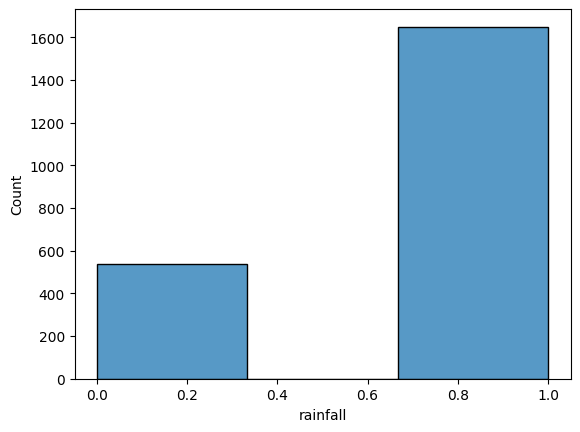

In [11]:
# Check Data in balanced or Imbalanced

sns.histplot(train['rainfall'],bins=3)
plt.show()

#### The dataset is imbalanced, with an approximate 80-20 class distribution. To address this imbalance and improve model performance, we apply sampling techniques such as undersampling, oversampling, or SMOTE. While these methods don't guarantee perfect results, they help reduce bias in the algorithm and ensure more balanced learning.

In [12]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
id,2190.0,1094.500000,632.342866,0.0,547.250,1094.50,1641.750,2189.0
day,2190.0,179.948402,105.203592,1.0,89.000,178.50,270.000,365.0
pressure,2190.0,1013.602146,5.655366,999.0,1008.600,1013.00,1017.775,1034.6
maxtemp,2190.0,26.365799,5.654330,10.4,21.300,27.80,31.200,36.0
temparature,2190.0,23.953059,5.222410,7.4,19.300,25.50,28.400,31.5
mintemp,2190.0,22.170091,5.059120,4.0,17.700,23.85,26.400,29.8
dewpoint,2190.0,20.454566,5.288406,-0.3,16.800,22.15,25.000,26.7
humidity,2190.0,82.036530,7.800654,39.0,77.000,82.00,88.000,98.0
cloud,2190.0,75.721918,18.026498,2.0,69.000,83.00,88.000,100.0
sunshine,2190.0,3.744429,3.626327,0.0,0.400,2.40,6.800,12.1


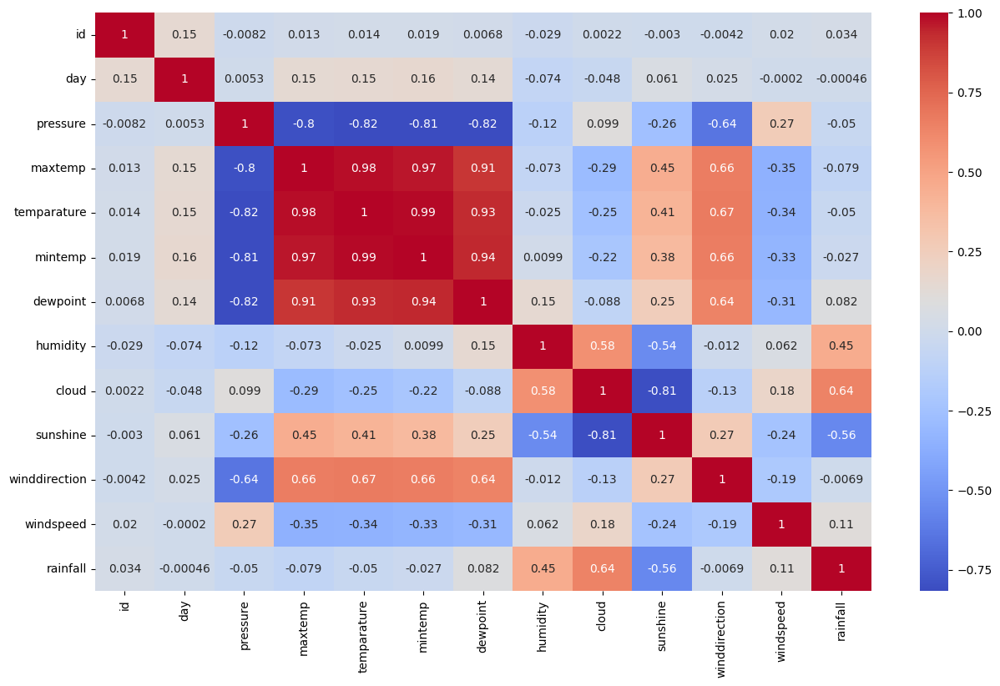

In [13]:
# Heatmap to check relation between columns

plt.figure(figsize=(15,9))
corr = train.corr()
sns.heatmap(corr,annot=True, cmap='coolwarm')
plt.show()

## Outlier Check

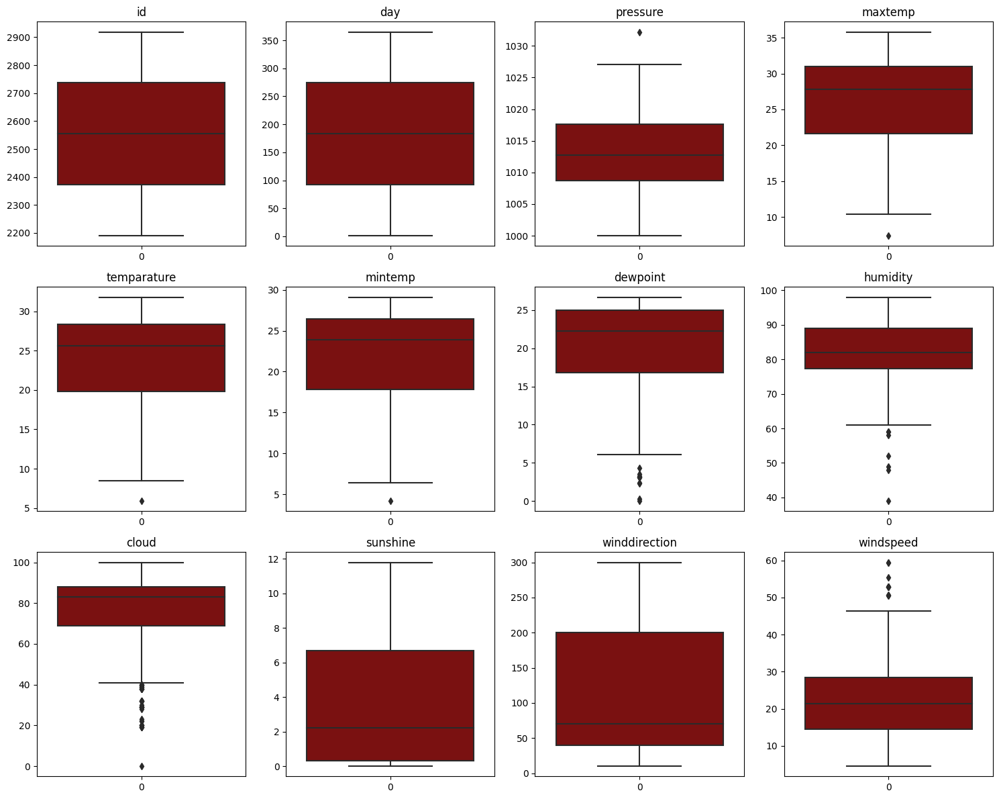

In [14]:
columns = test.columns.to_list()

def show_boxplot(data):
    len_data = len(data)
    num_cols = 4
    num_rows = (len_data + num_cols - 1) // num_cols
    
    plt.figure(figsize=(15, 4*num_rows))
    
    for i,col in enumerate(data):
        plt.subplot(num_rows,num_cols,i+1)
        sns.boxplot(test[col],color='darkred')
        plt.title(col)
        
    plt.tight_layout()
    plt.show()
show_boxplot(columns)

<a id='target'></a>
## <div style="text-align:center; border-radius:15px 50px; padding:7px; color:white; margin:0; font-size:100%; font-family:Pacifico; background-color:#d00000; overflow:hidden"><b> 5.1 Data Preprocessing </b></div>

In [15]:
# drop unique column form data
train = train.drop(columns=['id'],axis=1)
test = test.drop(columns=['id'],axis=1)

# It doesn’t carry useful information for prediction — it’s just a unique identifier.
# It can introduce noise or misleading patterns if used this feature.

In [16]:
# winddirection have null values in test dataset
mean = np.mean(test['winddirection'])
test['winddirection'] = test['winddirection'].fillna(mean)

<a id='target'></a>
## <div style="text-align:center; border-radius:15px 50px; padding:7px; color:white; margin:0; font-size:100%; font-family:Pacifico; background-color:#d00000; overflow:hidden"><b> 6. Feature Engineering </b></div>

In [17]:
# add new features in both train & test

# Train
train['relative_dryness'] = 100 - train['humidity']

train["dew_humidity"] = train["dewpoint"] * train["humidity"]
train["cloud_windspeed"] = train["cloud"] * train["windspeed"] 
train["cloud_to_humidity"] = train["cloud"] / train["humidity"]
train["temp_to_sunshine"] = train["sunshine"] / train["temparature"]

train['temp_diff'] = train['maxtemp'] - train['mintemp']
train['dew_temp_diff'] = train['dewpoint'] - train['temparature'] # Temperature differences



# Test
test['relative_dryness'] = 100 - test['humidity']

test["dew_humidity"] = test["dewpoint"] * test["humidity"]
test["cloud_windspeed"] = test["cloud"] * test["windspeed"] 
test["cloud_to_humidity"] = test["cloud"] / test["humidity"]
test["temp_to_sunshine"] = test["sunshine"] / test["temparature"]

test['temp_diff'] = test['maxtemp'] - test['mintemp']
test['dew_temp_diff'] = test['dewpoint'] - test['temparature'] # Temperature differences


In [18]:
# Feature Selection
train.drop(columns='maxtemp',axis=1,inplace=True)
test.drop(columns='maxtemp',axis=1,inplace=True)

train.drop(columns='mintemp',axis=1,inplace=True)
test.drop(columns='mintemp',axis=1,inplace=True)

# After checking correaltion with we remove maxtemp & mintemp both are highly corelated with temperature feature

<a id='target'></a>
## <div style="text-align:center; border-radius:15px 50px; padding:7px; color:white; margin:0; font-size:100%; font-family:Pacifico; background-color:#d00000; overflow:hidden"><b> 5.2 Data Preprocessing </b></div>

## Handling Outliers

In [19]:
# outlier fix for train & test
col_list = ['dewpoint','cloud','humidity','relative_dryness','windspeed','dew_humidity',
            'temp_diff','dew_humidity','temp_diff',
            'dew_temp_diff','temp_to_sunshine','cloud_to_humidity','cloud_windspeed']
def col_outlier(col,train):
    for i in col:
        Q1 = train[i].quantile(0.25)
        Q3 = train[i].quantile(0.75)
        IQR = Q3 - Q1

        
        lower_fen = Q1 - 1.5 * IQR
        upper_fen = Q3 + 1.5 * IQR

        train[i] =  np.where(train[i] > upper_fen,
                       upper_fen,
                       np.where(
                           train[i] < lower_fen,
                           lower_fen,
                           train[i]
                       )
                      )
# adjust outlier from both dataframe
col_outlier(col_list,train)
col_outlier(col_list,test)

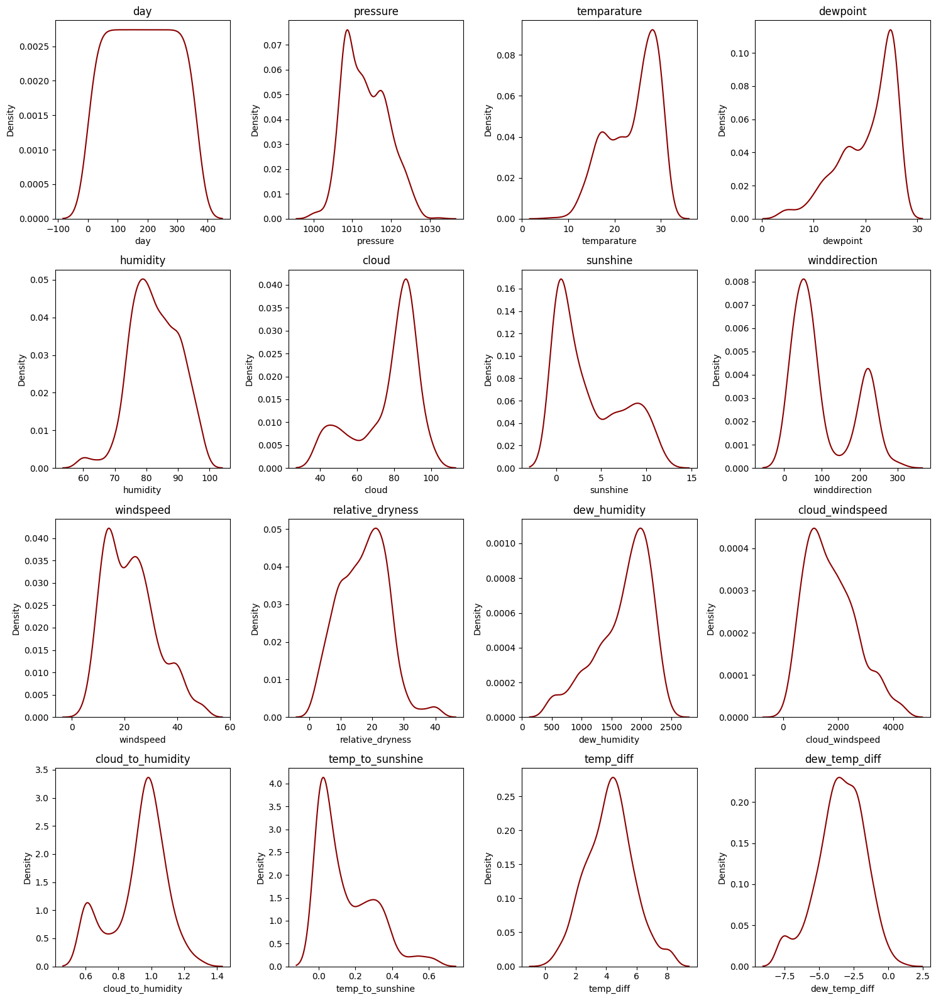

In [20]:
# Visualize after removing the outliers

test_columns = test.columns.to_list()

def show_boxplot(data):
    len_data = len(data)
    num_cols = 4
    num_rows = (len_data + num_cols - 1) // num_cols
    plt.figure(figsize=(15, 4*num_rows))
    
    for i,col in enumerate(data):
        plt.subplot(num_rows,num_cols,i+1)
        sns.kdeplot(test[col],color='darkred')
        plt.title(col)
        
    plt.tight_layout()
    plt.show()
show_boxplot(test_columns)

## Power & log Transformation

In [21]:
train.skew()

day                  0.030615
pressure             0.284062
temparature         -0.557471
dewpoint            -0.918185
humidity            -0.254535
cloud               -1.030718
sunshine             0.639871
winddirection        0.708063
windspeed            0.650174
rainfall            -1.176743
relative_dryness     0.254535
dew_humidity        -0.843133
cloud_windspeed      0.663911
cloud_to_humidity   -0.605849
temp_to_sunshine     0.980320
temp_diff            0.110760
dew_temp_diff       -0.466382
dtype: float64

In [22]:
# Power & log Transformation

left_skew = ['temparature','dewpoint','cloud','dew_humidity']
right_skew = ['windspeed','sunshine','temp_to_sunshine','winddirection','cloud_windspeed']

trf = FunctionTransformer(func=np.log1p) # right_skew
pt = PowerTransformer(method='box-cox') # left_skew

def apply_transformation(left_skew,right_skew):
    for col in right_skew:
        train[col] = trf.fit_transform(train[col])

    for col in left_skew:
        train[col] = pt.fit_transform((train[col]+0.000001).values.reshape(-1,1)).reshape(-1)
        # PowerTransformer expect a 2D input array of shape 
# again get back into 1d array with reshape(-1)

    for col in right_skew:
        test[col] = trf.fit_transform(test[col])
    
    for col in left_skew:
        test[col] = pt.fit_transform((test[col]+0.000001).values.reshape(-1,1)).reshape(-1)

apply_transformation(left_skew,right_skew)

In [23]:
train.skew()

day                  0.030615
pressure             0.284062
temparature         -0.240011
dewpoint            -0.369563
humidity            -0.254535
cloud               -0.362277
sunshine            -0.049655
winddirection       -0.159350
windspeed           -0.191188
rainfall            -1.176743
relative_dryness     0.254535
dew_humidity        -0.282583
cloud_windspeed     -0.746109
cloud_to_humidity   -0.605849
temp_to_sunshine     0.765535
temp_diff            0.110760
dew_temp_diff       -0.466382
dtype: float64

<a id='target'></a>
## <div style="text-align:center; border-radius:15px 50px; padding:7px; color:white; margin:0; font-size:100%; font-family:Pacifico; background-color:#d00000; overflow:hidden"><b> 7. Train Test Split </b></div>

In [24]:
train.head(2)

,day,pressure,temparature,dewpoint,humidity,cloud,sunshine,winddirection,windspeed,rainfall,relative_dryness,dew_humidity,cloud_windspeed,cloud_to_humidity,temp_to_sunshine,temp_diff,dew_temp_diff
0,1,1017.4,-0.761776,-0.416455,87.0,0.746133,0.741937,4.110874,2.901422,1,13.0,-0.163723,7.322907,1.011494,0.052021,1.3,-1.2
1,2,1019.5,-1.329096,-1.119183,95.0,1.063112,0.000000,3.931826,3.131137,1,5.0,-0.681778,7.597848,0.957895,0.000000,0.4,-1.5


In [25]:
X = train.drop(columns=['rainfall'])
y = train.iloc[:,-8]

X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42)

sc = StandardScaler()

X_train_scaled = sc.fit_transform(X_train)
X_test_scaled = sc.transform(X_test)

test = sc.fit_transform(test)

#### For X_train we used fit_transform because 
#### fit: Calculates the mean and standard deviation of X_train. 
#### For X_test we only used transform because 
#### This applies the same transformation using the mean and std from X_train to the test data.
#### This is critical to avoid data leakage.

In [26]:
# try to used sampling method 
# 1) SMOTEN & 2) KMeansSMOTE gives best result

from imblearn.over_sampling import KMeansSMOTE
samp = KMeansSMOTE(random_state=42)
X_train_sampled,y_train_sampled = samp.fit_resample(X_train_scaled,y_train)

In [27]:
print(f"Before sampling: {X_train.shape}")
print(f"After sampling: {X_train_sampled.shape}")

Before sampling: (1752, 16)
After sampling: (2663, 16)



<a id='target'></a>
## <div style="text-align:center; border-radius:15px 50px; padding:7px; color:white; margin:0; font-size:100%; font-family:Pacifico; background-color:#d00000; overflow:hidden"><b> 7.1 ANN </b></div>

In [28]:
# ANN(Artificial Neural Network)

import tensorflow 
from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense

model = Sequential()
model.add(Dense(16,activation='relu',input_dim=16))
model.add(Dense(32,activation='relu'))
model.add(Dense(64,activation='relu'))
model.add(Dense(1,activation='sigmoid'))

model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])

callback = keras.callbacks.EarlyStopping(
    monitor="val_loss",
    min_delta=0,
    patience=0,
    verbose=0,
    mode="auto",
    baseline=None,
    restore_best_weights=False,
    start_from_epoch=0,
)


history = model.fit(X_train_sampled,y_train_sampled,epochs=100,validation_data=(X_test_scaled,y_test),verbose=1,callbacks=callback)

Epoch 1/100
84/84 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.7476 - loss: 0.5452 - val_accuracy: 0.8242 - val_loss: 0.4129
Epoch 2/100
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8980 - loss: 0.2621 - val_accuracy: 0.8288 - val_loss: 0.4137


In [29]:
y_pred = model.predict(X_test_scaled)
y_pred_class = (y_pred > 0.49).astype(int) 
acc = accuracy_score(y_test,y_pred_class)
acc

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


0.8310502283105022

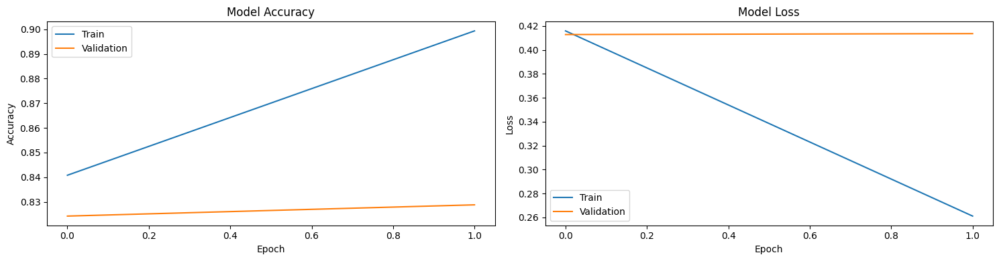

In [30]:
plt.figure(figsize=(15,4))

# Accuracy Plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'])

# Loss Plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'])

plt.tight_layout()
plt.show()

<a id='target'></a>
## <div style="text-align:center; border-radius:15px 50px; padding:7px; color:white; margin:0; font-size:100%; font-family:Pacifico; background-color:#d00000; overflow:hidden"><b> 8. Model Training </b></div>

In [31]:
# import algorithmn

lg = LogisticRegression()
nb = GaussianNB()
svc = SVC(probability=True)
dtc = DecisionTreeClassifier()
rfc = RandomForestClassifier()
knc = KNeighborsClassifier()

adc = AdaBoostClassifier()
gbc = GradientBoostingClassifier()
xgb1 = xgb.XGBClassifier()

In [32]:

model_list = [lg, nb, svc, dtc, rfc, knc, adc, gbc,xgb1]

def model_predict(model_list):
    Algorithmn = []
    Accuracy = []
    for i in model_list:
        i.fit(X_train_sampled, y_train_sampled) 
        y_pred = i.predict(X_test_scaled)  
        acc = accuracy_score(y_test, y_pred)
        Algorithmn.append(type(i).__name__)
        Accuracy.append(float(f"{acc:.8f}"))
        
    return pd.DataFrame({'Algorithmn': Algorithmn, 'Accuracy': Accuracy})
result = model_predict(model_list)
result

,Algorithmn,Accuracy
0,LogisticRegression,0.842466
1,GaussianNB,0.837900
2,SVC,0.840183
3,DecisionTreeClassifier,0.769406
4,RandomForestClassifier,0.847032
5,KNeighborsClassifier,0.833333
6,AdaBoostClassifier,0.826484
7,GradientBoostingClassifier,0.847032
8,XGBClassifier,0.835616


## ROC_AUC Curve

In [33]:
# ROC_AUC Curve

y_scores = lg.predict_proba(X_test_scaled)[:,1]
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, y_scores)

optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
print("Optimal threshold is:", optimal_threshold)

y_pred = (y_scores >= optimal_threshold).astype(int)

Optimal threshold is: 0.38884938135801467


In [34]:
y_pred = (y_scores >= 0.51).astype(int)
accuracy_score(y_test, y_pred)

0.8424657534246576

<a id='target'></a>
## <div style="text-align:center; border-radius:15px 50px; padding:7px; color:white; margin:0; font-size:100%; font-family:Pacifico; background-color:#d00000; overflow:hidden"><b> 8.1 RandomizedSearchCV </b></div>

## SVC(Support Vecor Classifier)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
RandomizedSearchCV: 0.8470319634703196
{'kernel': 'sigmoid', 'gamma': 0.001, 'class_weight': None, 'C': 1.0}
Best cross-validation accuracy: 0.9016
Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.66      0.70       119
           1       0.88      0.92      0.90       319

    accuracy                           0.85       438
   macro avg       0.81      0.79      0.80       438
weighted avg       0.84      0.85      0.84       438



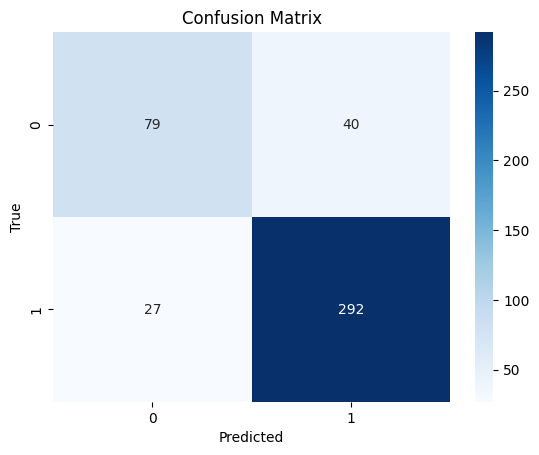

In [42]:
param_grid = {
    'C': [0.1, 1.0, 10, 100],
    'gamma': [1, 0.1, 0.01, 0.001],
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'class_weight': [None, 'balanced']
}

random_search_svc = RandomizedSearchCV(estimator=svc, param_distributions=param_grid, cv=5, 
                           scoring='accuracy', verbose=1, n_jobs=-1)

random_search_svc.fit(X_train_sampled, y_train_sampled)
y_pred = random_search_svc.predict(X_test_scaled)  
acc = accuracy_score(y_test, y_pred)

print(f'RandomizedSearchCV: {acc}')
print(random_search_svc.best_params_)
print(f"Best cross-validation accuracy: {random_search_svc.best_score_:.4f}")


# Print detailed classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Plot confusion matrix with the customized colormap
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

## lg(Logistic Regression)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
RandomizedSearchCV: 0.8401826484018264
{'solver': 'saga', 'penalty': 'l1', 'max_iter': 500, 'C': 0.01}
Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.66      0.69       119
           1       0.88      0.91      0.89       319

    accuracy                           0.84       438
   macro avg       0.80      0.78      0.79       438
weighted avg       0.84      0.84      0.84       438



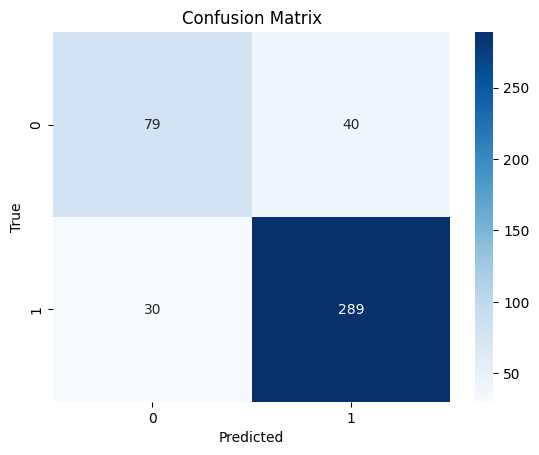

In [40]:
param_grid_lg = {
    'C': [0.01, 0.1, 1.0, 10, 100],
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'solver': ['lbfgs', 'liblinear', 'saga'], 
    'max_iter': [100, 200, 500]
}

random_search_lg = RandomizedSearchCV(estimator=lg, param_distributions=param_grid_lg, cv=5, 
                           scoring='accuracy', verbose=1, n_jobs=-1)

random_search_lg.fit(X_train_sampled, y_train_sampled)
y_pred = random_search_lg.predict(X_test_scaled) 
acc = accuracy_score(y_test, y_pred)
print(f'RandomizedSearchCV: {acc}')
print(random_search_lg.best_params_)

# Print detailed classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Plot confusion matrix with the customized colormap
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

## GBC(Gradient Boosting Classifier)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
RandomizedSearchCV: 0.8515981735159818
{'subsample': 1.0, 'n_estimators': 300, 'max_features': 'log2', 'max_depth': 7, 'learning_rate': 0.1}
Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.61      0.69       119
           1       0.86      0.94      0.90       319

    accuracy                           0.85       438
   macro avg       0.83      0.77      0.80       438
weighted avg       0.85      0.85      0.84       438



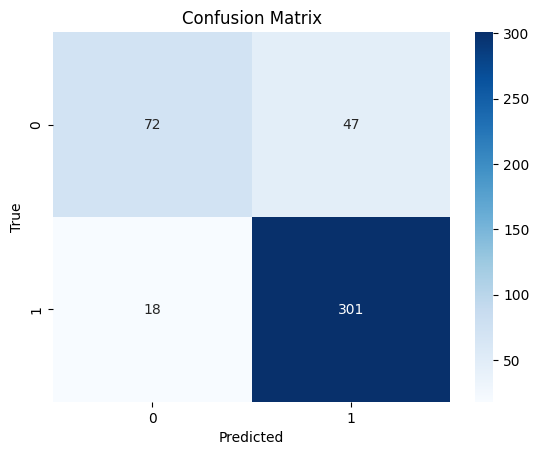

In [41]:
param_grid_gbc = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'max_features': ['sqrt', 'log2']
}

random_search_gbc = RandomizedSearchCV(estimator=gbc, param_distributions=param_grid_gbc, cv=5, 
                           scoring='accuracy', verbose=1, n_jobs=-1)

random_search_gbc.fit(X_train_sampled, y_train_sampled)
y_pred = random_search_gbc.predict(X_test_scaled)  
acc = accuracy_score(y_test, y_pred)
print(f'RandomizedSearchCV: {acc}')
print(random_search_gbc.best_params_)

# Print detailed classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Plot confusion matrix with the customized colormap
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

<a id='target'></a>
## <div style="text-align:center; border-radius:15px 50px; padding:7px; color:white; margin:0; font-size:100%; font-family:Pacifico; background-color:#d00000; overflow:hidden"><b> 8.2 Voting Classifier </b></div>

In [43]:
from sklearn.pipeline import make_pipeline

# SVC
best_svc = SVC(
    C= 100, 
    kernel= 'rbf', 
    gamma= 1, 
    class_weight= None,
    probability = True
)

svc_pipeline = make_pipeline(best_svc)

# lg
best_lg = LogisticRegression(C=0.01, max_iter=200, penalty='l2', solver='liblinear')

lg_pipeline = make_pipeline(best_lg)

# gbc

best_gbc = GradientBoostingClassifier(
    learning_rate=0.01,
    max_depth=7,
    max_features='log2',
    n_estimators=300,
    subsample=1.0
)

gbc_pipeline = make_pipeline(best_gbc) 


0.8424657534246576
Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.61      0.68       119
           1       0.86      0.93      0.90       319

    accuracy                           0.84       438
   macro avg       0.81      0.77      0.79       438
weighted avg       0.84      0.84      0.84       438



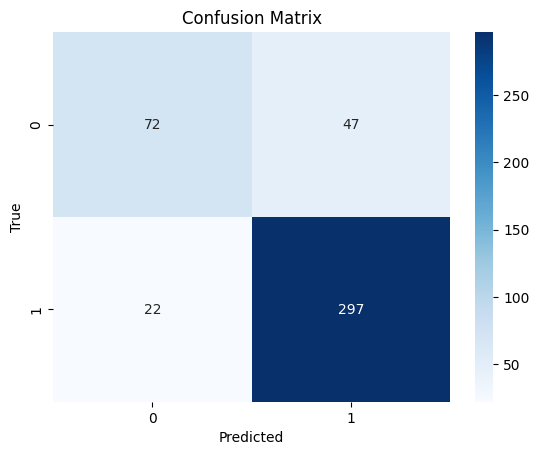

In [44]:
# Create a VotingClassifier with the best estimators
voting_clf = VotingClassifier(
    estimators=[
        ('lg', lg_pipeline),
        ('svc', svc_pipeline),
        ('gbc', gbc_pipeline)
        
    ],
    voting='soft'
)

# Fit the VotingClassifier on your resampled training data
voting_clf.fit(X_train_sampled, y_train_sampled)
y_pred = voting_clf.predict(X_test_scaled)
result = accuracy_score(y_test,y_pred)
print(result)

# Print detailed classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Plot confusion matrix with the customized colormap
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [79]:
y_pred_sampled = voting_clf.predict(test)
submission_new = pd.DataFrame({'id':sub['id'],'rainfall':y_pred_sampled})
submission_new.head(2)

,id,rainfall
0,2190,1
1,2191,1


In [81]:
submission_new.to_csv('submission_new.csv', index=False)

<a id='target'></a>
## <div style="text-align:center; border-radius:15px 50px; padding:7px; color:white; margin:0; font-size:100%; font-family:Pacifico; background-color:#d00000; overflow:hidden"><b> 9. Conclusion </b></div>


### The best-performing models were GBC(Gradient Boosting Classifier).
### Their simplicity and reduced risk of overfitting made them more effective than complex algorithms, especially with our limited dataset.

<div style="display: flex; justify-content: center;">
    <img src="https://i.giphy.com/gEP2k49ndOqJDBSPZl.webp" alt="GIF">
</div>